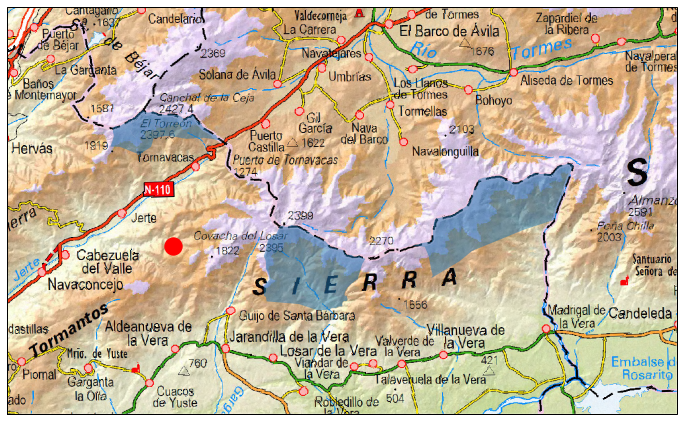

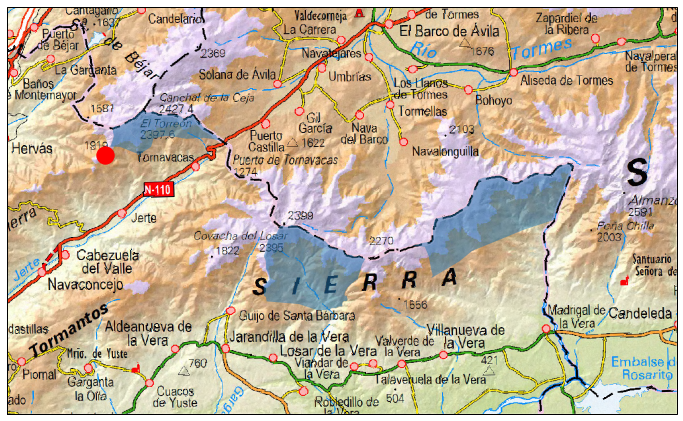

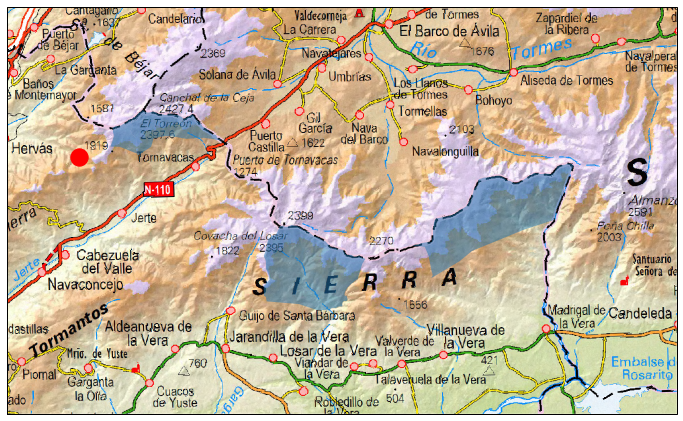

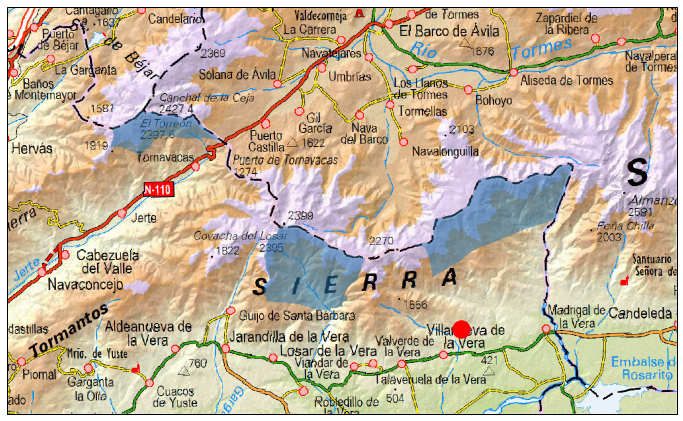

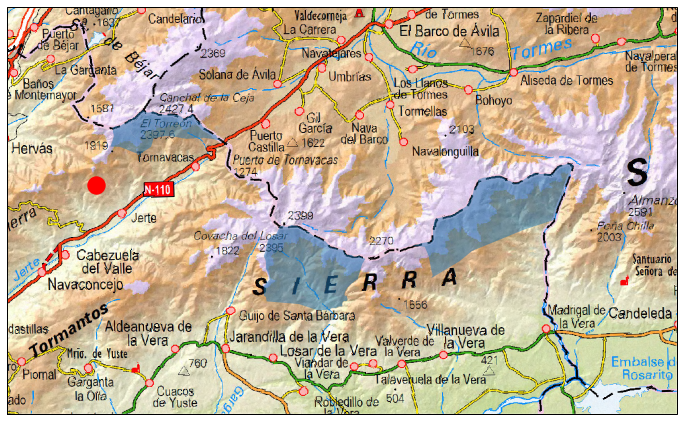

...

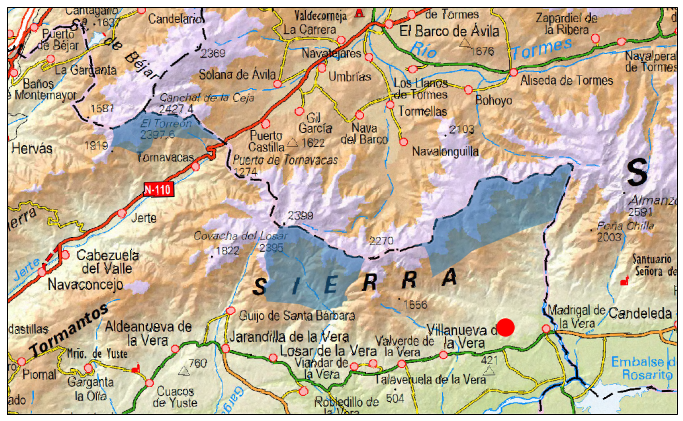

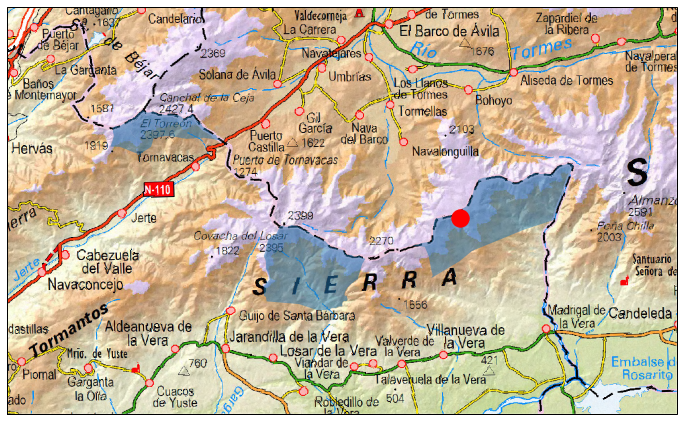

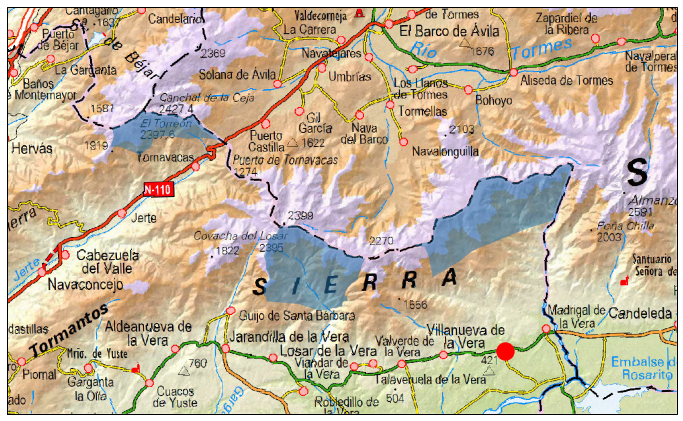

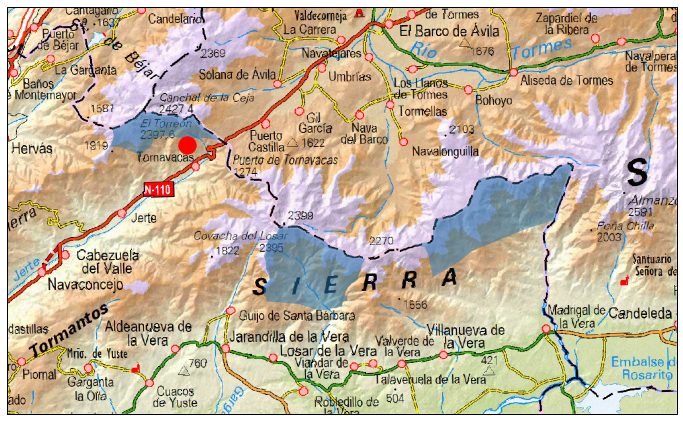

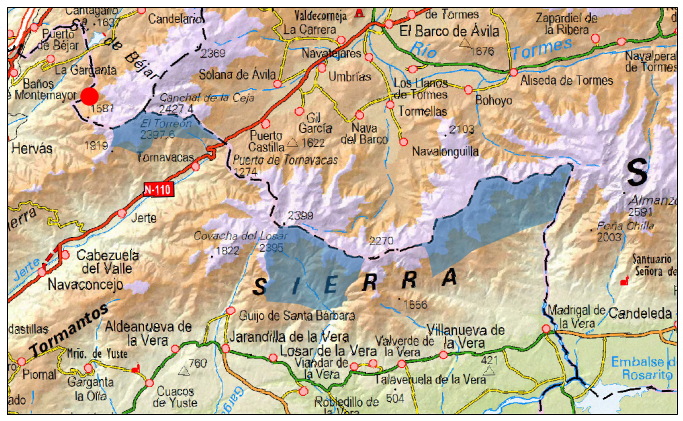

In [3]:
import psycopg2
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import requests
from bs4 import BeautifulSoup
from IPython.core.display import HTML
from requests.auth import HTTPBasicAuth
from config import config

#TODO solo tengo incendios con el huso 30 de caceres ampliar a huso 29 y ávila y salamanca

# DATOS INCENDIOS
params = config()
conn = psycopg2.connect(**params)
cur = conn.cursor()
    
# DATOS MAPA 

sql = '''SELECT * 
        FROM incendios_proximos_ze 
        ORDER by tot desc
        '''

ze = gpd.read_postgis('select * from zona_estudio_afinada', conn)
inc = gpd.read_postgis(sql, conn)[:20]
conn.close()
proj = ccrs.TransverseMercator(central_longitude=-3.0,central_latitude=0.0,
                           false_easting=500000.0,false_northing=0.0,
                           scale_factor=0.9996)



# DATOS METEO    
    
for key, value in inc.iterrows():
    fecha = value['deteccion']
    dia = fecha.strftime('%d')
    mes = fecha.strftime('%m')
    anho = fecha.strftime('%Y')
    
    redarex_url = 'http://redarexplus.gobex.es/REDAREX_plus/index.php'
    redarex_data = {
        'fecha_desde':'{}/{}/{}'.format(dia,mes,anho), 
        'fecha_hasta':'{}/{}/{}'.format(dia,mes,anho), 
        'chkTempMedia':'on',
        'chkHumedadRelativaMed': 'on',
        'chkVelViento': 'on',
        'chkDireccionViento': 'on',
        'aceptar':'Consultar', 
        'estacionesSeleccionadas':'10_13'
    }
    date = []
    hora = []
    temp = []
    hrel = []
    velviento = []
    dirviento = []
    
    for n in range(0, 48, 12):
        redarex_params = {
            'modulo':'agrometeorologia', 
            'camino': 'Agrometeorolog%EDa', 
            'pagina':'datos.php', 
            'rango':'semihorarios', 
            'estacionesSeleccionadas': 
            '10_13', 
            'paginando':'on', 
            'limite':n
        }
        r = requests.post(redarex_url, params=redarex_params, auth=HTTPBasicAuth('bartulo@gmail.com', 'ventanuco'), data=redarex_data)
        soup = BeautifulSoup(r.content, 'html.parser')
        
        for j in range(12):
            a = soup.findAll('td', class_='txt_normal')
            date.append(a[j * 6 + 6].find('font').text.strip())
            hora.append(a[j * 6 + 7].find('font').text.strip())
            temp.append(float(a[j * 6 + 8].find('font').text.strip()))
            hrel.append(float(a[j * 6 + 9].find('font').text.strip()))
            velviento.append(float(a[j * 6 + 10].find('font').text.strip()))
            dirviento.append(float(a[j * 6 + 11].find('font').text.strip()))
            
    tabla = pd.DataFrame({'fecha': date, 'hora': hora, 'temperatura media': temp, 'humedad rel. media': hrel, 'velocidad viento':velviento, 'dirección viento': dirviento})

    # PRIMER GRÁFICO

    fig, ax1 = plt.subplots()
    
    plt.ylim([0,45])
    color = 'tab:red'
    ax1.set_xlabel('Hora {}'.format(date[0]))
    ax1.set_ylabel('Temperatura (ºC)', color=color)
    ax1.plot(hora, temp, color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    
    ax2 = ax1.twinx()
    plt.ylim([0,100])
    color = 'tab:blue'
    ax2.set_ylabel('Humedad relativa (%)', color=color)
    ax2.plot(hora, hrel)
    ax2.tick_params(axis='y', labelcolor=color)
    fig.tight_layout()
    plt.xticks([6, 12, 18, 24, 30, 36, 42, 48])

    f = '{}_{}_{}'.format(dia,mes,anho)
#     plt.savefig('static/images/plot1_{}'.format(f))
    plt.close(fig)
    
    # SEGUNDO GRÁFICO
    
    fig2, ax3 = plt.subplots()
    
    plt.ylim([0,5])
    color = 'tab:orange'
    ax3.set_xlabel('Hora {}'.format(date[0]))
    ax3.set_ylabel('Velocidad del viento (m/s)', color=color)
    ax3.plot(hora, velviento, color=color)
    ax3.tick_params(axis='y', labelcolor=color)
    
    ax4 = ax3.twinx()
    plt.ylim([0,360])
    color = 'tab:green'
    ax4.set_ylabel('Dirección del viento', color=color)
    ax4.plot(hora, dirviento, color=color)
    ax4.tick_params(axis='y', labelcolor=color)
    fig.tight_layout()
    plt.xticks([6, 12, 18, 24, 30, 36, 42, 48])

#     plt.savefig('static/images/plot2_{}'.format(f))
    plt.close(fig2)
    
    # MAPA
    
    fig3 = plt.figure(figsize=(12,8))
    ax5 = plt.axes(projection=proj)
    minx = float(ze.bounds.min()['minx'] - 8000)
    maxx = float(ze.bounds.max()['maxx'] + 8000)
    miny = float(ze.bounds.min()['miny'] - 8000)
    maxy = float(ze.bounds.max()['maxy'] + 8000)
    ax5.set_extent([minx, maxx, miny, maxy], crs=proj)
    ax5.add_wms(wms='https://www.ign.es/wms-inspire/mapa-raster', layers=['mtn_rasterizado'])
    ze.plot(ax=ax5,alpha=0.5)
    inc.loc[[key], 'geom'].plot(ax=ax5, color='red', markersize=300)
    plt.savefig('static/images/incendio_{}'.format(value['idpif']), bbox_inches='tight', pad_inches=0)
    plt.show()
    plt.close(fig3)